# 0.0 Imports

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import inflection 
import plotly.express as px
import umap as umap
import re
import sweetviz as sv

from matplotlib import pyplot as plt
from IPython.display import HTML
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn import metrics
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from ydata_profiling import ProfileReport
from sklearn import decomposition as dd
from sklearn.manifold import TSNE
from sklearn.ensemble import RandomForestRegressor
from sklearn.mixture import GaussianMixture


In [2]:
%matplotlib inline

## 0.1 Helper Functions

### Set Display

In [3]:
def notebook_settings():
    plt.style.use( 'ggplot' )
    plt.rcParams['figure.figsize'] = [24, 9]
    plt.rcParams['font.size'] = 24

    display(HTML('<style>.container {width:100% !important;}</style>'))
    pd.options.display.max_columns=None
    pd.options.display.max_rows=None
    pd.set_option( 'display.expand_frame_repr', False)

    sns.set()
notebook_settings()

In [4]:
# supress scientific notation
pd.set_option('display.float_format', lambda x: '%.3f' % x)

## 0.2 Load Data

In [5]:
data = pd.read_csv('../data/raw/data.csv', encoding='unicode_escape')

# Planification (IoT)

# 1.0 Data Description

### 1.1 Data Dimensions

In [66]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


In [67]:
data.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.550,17850.000,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.390,17850.000,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.750,17850.000,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.390,17850.000,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.390,17850.000,United Kingdom


### 1.2 Rename Columns

In [6]:
cols_old = ['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country']

snakecase = lambda x: inflection.underscore( x ) # change to snakecase
cols_new = list( map( snakecase, cols_old ))

data.columns = cols_new # define the new columns

### 1.3 Check and fillout Nan

In [7]:
# check Na
data.isna().sum()

invoice_no           0
stock_code           0
description       1454
quantity             0
invoice_date         0
unit_price           0
customer_id     135080
country              0
dtype: int64

In [8]:
# replace NA
df_missing = data[data['customer_id'].isna()]
df_not_missing = data[~data['customer_id'].isna()]
print(f'Missing: {df_missing.shape[0]}')
print(f'Not Missing: {df_not_missing.shape[0]}')

Missing: 135080
Not Missing: 406829


In [9]:
# create reference
backup = pd.DataFrame(df_missing['invoice_no'].drop_duplicates())
backup['customer_id'] = np.arange(19000, 19000+len(backup), 1)

# merge original data frame
df1 = pd.merge(data, backup, on='invoice_no', how='left')

#coalesce
df1['customer_id'] = df1['customer_id_x'].combine_first(df1['customer_id_y'])

# drop columns
df1 = df1.drop(columns=['customer_id_x', 'customer_id_y'], axis=1)

In [10]:
df1.isna().sum()

invoice_no         0
stock_code         0
description     1454
quantity           0
invoice_date       0
unit_price         0
country            0
customer_id        0
dtype: int64

### 1.4 Change dtypes

In [11]:
# invoice data to datetime
df1['invoice_date'] = pd.to_datetime(df1['invoice_date'])#.dt.date
#df1['invoice_date'] = df1['invoice_date'].dt.date

# customer id
df1['customer_id'] = df1['customer_id'].astype(int)

### 1.5 Descriptive Statistics

In [74]:
num_att = df1.select_dtypes(include=['int64', 'float64'])
cat_att = df1.select_dtypes( exclude=['int64', 'float64', 'datetime64[ns]'])

#### Numerical

In [75]:
# central tendency - mean and median
mean = pd.DataFrame(num_att.apply( np.mean )).T
median = pd.DataFrame(num_att.apply( np.median )).T

# dispertion - std, min, max, range, skew, kurtosis
std = pd.DataFrame(num_att.apply( np.std )).T
min_ = pd.DataFrame(num_att.apply( np.min )).T
max_ = pd.DataFrame(num_att.apply( np. max )).T
range_ = pd.DataFrame(num_att.apply( lambda x: x.max() - x.min())).T
skew = pd.DataFrame(num_att.apply( lambda x: x.skew())).T
kurtosis = pd.DataFrame(num_att.apply( lambda x: x.kurtosis())).T

# concatenate
description = pd.concat([mean, median, std, min_, max_, range_, skew, kurtosis]).T.reset_index()
description.columns = ['index', 'mean', 'median', 'std', 'min', 'max', 'range', 'skew', 'kurtosis']


In [76]:
description

,index,mean,median,std,min,max,range,skew,kurtosis
0,quantity,9.552,3.000,218.081,-80995.000,80995.000,161990.000,-0.264,119769.160
1,unit_price,4.611,2.080,96.760,-11062.060,38970.000,50032.060,186.507,59005.719
2,customer_id,16688.840,16249.000,2911.409,12346.000,22709.000,10363.000,0.487,-0.804


#### Categorical

In [77]:
# invoice number

# There are some 'invoice_no' that starts with a 'C', and the number matchs with the number of quantities < 0.
# I will supose that 'C' represents orders that was returned

invoice_letter = df1[df1['invoice_no'].apply(lambda x: bool(re.search('[^0-9]', x)))]
print(f'Nº of invoice with a letter: {invoice_letter.shape[0]}')
print(f'Nº of quantity < 0: {df1[df1["quantity"] < 0].shape[0]}')

Nº of invoice with a letter: 9291
Nº of quantity < 0: 10624


In [78]:
# Stock code

# Action
# remove stock_code in ['POST', 'D', 'M', 'PADS', 'DOT', 'CRUK']

only_str_stock = df1.loc[df1['stock_code'].apply(lambda x: bool(re.search('^[a-zA-Z]+$', x))), 'stock_code']
print(df1.loc[df1['stock_code'].apply(lambda x: bool(re.search('^[a-zA-Z]+$', x))), 'stock_code'].unique())
print(f'Only String stock_code: {only_str_stock.shape[0]}')


['POST' 'D' 'DOT' 'M' 'S' 'AMAZONFEE' 'm' 'DCGSSBOY' 'DCGSSGIRL' 'PADS'
 'B' 'CRUK']
Only String stock_code: 2759


In [79]:
# Country

# nº invoice_no by country
by_country = df1[['invoice_no', 'country']].groupby('country').count().reset_index()
by_country['%'] = by_country['invoice_no'].apply( lambda x: 100 * (x / df1.shape[0]))
by_country.sort_values('invoice_no', ascending=False).head()

,country,invoice_no,%
36,United Kingdom,495478,91.432
14,Germany,9495,1.752
13,France,8557,1.579
10,EIRE,8196,1.512
31,Spain,2533,0.467


In [80]:
# total revenue by country
rev = df1[['quantity', 'unit_price', 'country']].copy()
rev['total'] = rev['quantity'] * rev['unit_price']

rev_by_country = rev[['country', 'total']].groupby('country').sum().reset_index()
rev_by_country['%'] = rev_by_country['total'].apply(lambda x: 100 * (x/sum(rev_by_country['total']))) 
rev_by_country.sort_values('total', ascending=False).head()

,country,total,%
36,United Kingdom,8187806.364,83.997
24,Netherlands,284661.540,2.920
10,EIRE,263276.820,2.701
14,Germany,221698.210,2.274
13,France,197403.900,2.025


In [81]:
# customers by country
customer_by_contry = df1[['customer_id', 'country']].drop_duplicates().groupby('country').count().sort_values('customer_id', ascending=False).reset_index()
customer_by_contry['%'] = customer_by_contry['customer_id'].apply( lambda x: 100 * (x/sum(customer_by_contry['customer_id'])))
customer_by_contry.head()

,country,customer_id,%
0,United Kingdom,7587,93.782
1,Germany,95,1.174
2,France,90,1.112
3,EIRE,44,0.544
4,Spain,31,0.383


# 2.0 Filtragem de variáveis

In [12]:
df2 = df1.copy()

In [13]:
# unit price > 0.04
df2 = df2.loc[df2['unit_price'] > 0.04, :]

# stock code 
df2 = df2[~df2['stock_code'].isin(['POST', 'D', 'DOT', 'M', 'S', 'AMAZONFEE', 'm', 'DCGSSBOY',
                                   'DCGSSGIRL','PADS', 'B', 'CRUK'])]

# description
df2 = df2.drop(columns='description', axis=1)

#map
df2 = df2[~df2['country'].isin(['European Community', 'Unspecified'])]


# quantity - negative numbers means product returns
df2_returns = df2.loc[df2['quantity'] < 0, :]
df2 = df2.loc[df2['quantity'] > 0, :]

# bad users
df2 = df2[~df2['customer_id'].isin([16446])]

# 3.0 Feature Engineering

In [14]:
# date reference 
df_ref = df2.drop(['invoice_no', 'stock_code',
                   'quantity', 'invoice_date', 'unit_price', 
                   'country'], axis=1).drop_duplicates(ignore_index=True)

In [15]:
# Gross revenue (quantity * price)
df2['revenue'] = df2['unit_price'] * df2['quantity']

# Monetery
monetary = df2[['customer_id', 'revenue']].groupby('customer_id').sum().reset_index()
df_ref = pd.merge(df_ref, monetary, on='customer_id', how='left')

# Recency (the last purchase)
recency = df2[['customer_id', 'invoice_date']].groupby('customer_id').max().reset_index()
recency['recency_days'] = (df2['invoice_date'].max() - recency['invoice_date']).apply(lambda x: x.days)
recency = recency[['customer_id', 'recency_days']]
df_ref = pd.merge(df_ref, recency, on='customer_id', how='left')

# quantity of purchase
quantity = df2[['customer_id', 'invoice_no']].drop_duplicates().groupby('customer_id').count().reset_index()
quantity.columns = ['customer_id', 'purchases']
df_ref = pd.merge(df_ref, quantity, on='customer_id', how='left')

# Avg Ticket
avg_ticket = df2[['customer_id', 'revenue']].groupby('customer_id').mean().reset_index().rename(columns={'revenue': 'avg_ticket'})
df_ref = pd.merge(df_ref, avg_ticket, on='customer_id', how='left')

# number of returns
df_returns = df2_returns[['customer_id', 'quantity']].groupby('customer_id').sum().reset_index().rename(columns={'quantity':'returns'})
df_ref = pd.merge(df_ref, df_returns, how='left', on='customer_id')
df_ref = df_ref.fillna(0)
df_ref['returns'] = df_ref['returns'].astype(int) * -1

# # quantity of items purchased
product_quantity = df2[['customer_id', 'quantity']].groupby('customer_id').sum().reset_index()
product_quantity.columns = ['customer_id', 'items']
df_ref = pd.merge(df_ref, product_quantity, on='customer_id', how='left')

# # quantity products purchased
product_purchased = df2[['customer_id', 'stock_code']].groupby('customer_id').count().reset_index()
product_purchased.columns = ['customer_id', 'products_purchased']
df_ref = pd.merge(df_ref, product_purchased, on='customer_id', how='left')

In [16]:
# basket size
# basket_size = df2[['customer_id', 'quantity']].groupby('customer_id').sum().reset_index()
# df_ref = pd.merge(df_ref, basket_size, on='customer_id', how='left')

In [17]:
# avg_basket_size
df_auxx = (df2[['customer_id', 'invoice_no', 'quantity']].groupby('customer_id')
                                              .agg( n_purchases = ('invoice_no', 'nunique'),
                                                    n_products = ('quantity', 'sum'))
                                               .reset_index())

# calculation
df_auxx['avg_basket_size'] = df_auxx['n_products'] / df_auxx['n_purchases']

#merge
df_auxx = df_auxx[['customer_id', 'avg_basket_size']]
df_ref = pd.merge(df_ref, df_auxx, on='customer_id', how='left')

In [18]:
# avg basket size unique items 
df_basket = df_auxx = (df2[['customer_id', 'invoice_no', 'stock_code']].groupby('customer_id')
                                              .agg( n_purchases = ('invoice_no', 'nunique'),
                                                    n_products = ('stock_code', 'nunique'))
                                               .reset_index())

# calculation
df_auxx['avg_basket_unique'] = df_auxx['n_products'] / df_auxx['n_purchases']

#merge
df_auxx = df_auxx[['customer_id', 'avg_basket_unique']]
df_ref = pd.merge(df_ref, df_auxx, on='customer_id', how='left')

In [19]:
# frequency
# dates interval
df_aux = df2.drop_duplicates().groupby('customer_id')['invoice_date'].agg(['min', 'max']).rename(columns={'min': 'min_date', 'max': 'max_date'}).reset_index()
df_aux['date_interval'] = (df_aux['max_date'] - df_aux['min_date']).dt.days # calculate the interval

# total orders by customer
df_aux2 = df2[['customer_id', 'invoice_no']].drop_duplicates().groupby('customer_id').count().reset_index()
df_aux = pd.merge(df_aux, df_aux2, on='customer_id', how='left')

# frequency
df_aux['frequency'] = df_aux[['invoice_no', 'date_interval']].apply( lambda x: x['invoice_no'] / x['date_interval']  if x['date_interval'] != 0 else 0, axis=1)
df_ref = pd.merge(df_ref, df_aux.loc[:, ['customer_id', 'frequency']], on='customer_id', how='left')

In [20]:
# avg recency days (meiga)
dff = df2[['customer_id','invoice_date']].drop_duplicates().sort_values(['customer_id', 'invoice_date'], ascending=False)
dff['previous_customer_id'] = dff['customer_id'].shift()
dff['customer_id'] = dff['customer_id'].astype(float)
dff['previous_date'] = dff['invoice_date'].shift()
dff['avg_recency_days'] = dff.apply( lambda x: ( x['previous_date'] - x['invoice_date'] ).days if x['customer_id'] == x['previous_customer_id'] else 0.0, axis=1)

dff = dff.drop(['invoice_date', 'previous_customer_id', 'previous_date'], axis=1)
df_aux_recency = dff.groupby('customer_id').mean().reset_index()

df_ref = pd.merge(df_ref, df_aux_recency, on='customer_id', how='left')


In [21]:
df_ref.head()

,customer_id,revenue,recency_days,purchases,avg_ticket,returns,items,products_purchased,avg_basket_size,avg_basket_unique,frequency,avg_recency_days
0,17850,5391.210,371,34,18.152,40,1733,297,50.971,0.618,34.000,0.000
1,13047,3232.590,56,9,18.904,35,1390,171,154.444,11.667,0.028,39.375
2,12583,6705.380,2,15,28.902,50,5028,232,335.200,7.600,0.041,24.267
3,13748,948.250,95,5,33.866,0,439,28,87.800,4.800,0.018,69.250
4,15100,876.000,333,3,292.000,22,80,3,26.667,0.333,0.075,13.000


# 4.0 EDA

In [22]:
df4 = df_ref.copy()

### 4.1 Univariate Analysis

In [93]:
profile = ProfileReport(df4, title="Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [94]:
# sweetviz
report = sv.analyze(df4)

report.show_html('EDA.html')

                                             |          | [  0%]   00:00 -> (? left)

Report EDA.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


### 4.2 Bivariate Analysis

In [95]:
df42 = df4.drop('customer_id', axis=1)

/snap/core20/current/lib/x86_64-linux-gnu/libstdc++.so.6: version `GLIBCXX_3.4.29' not found (required by /lib/x86_64-linux-gnu/libproxy.so.1)
Failed to load module: /home/natan/snap/code/common/.cache/gio-modules/libgiolibproxy.so


Opening in existing browser session.


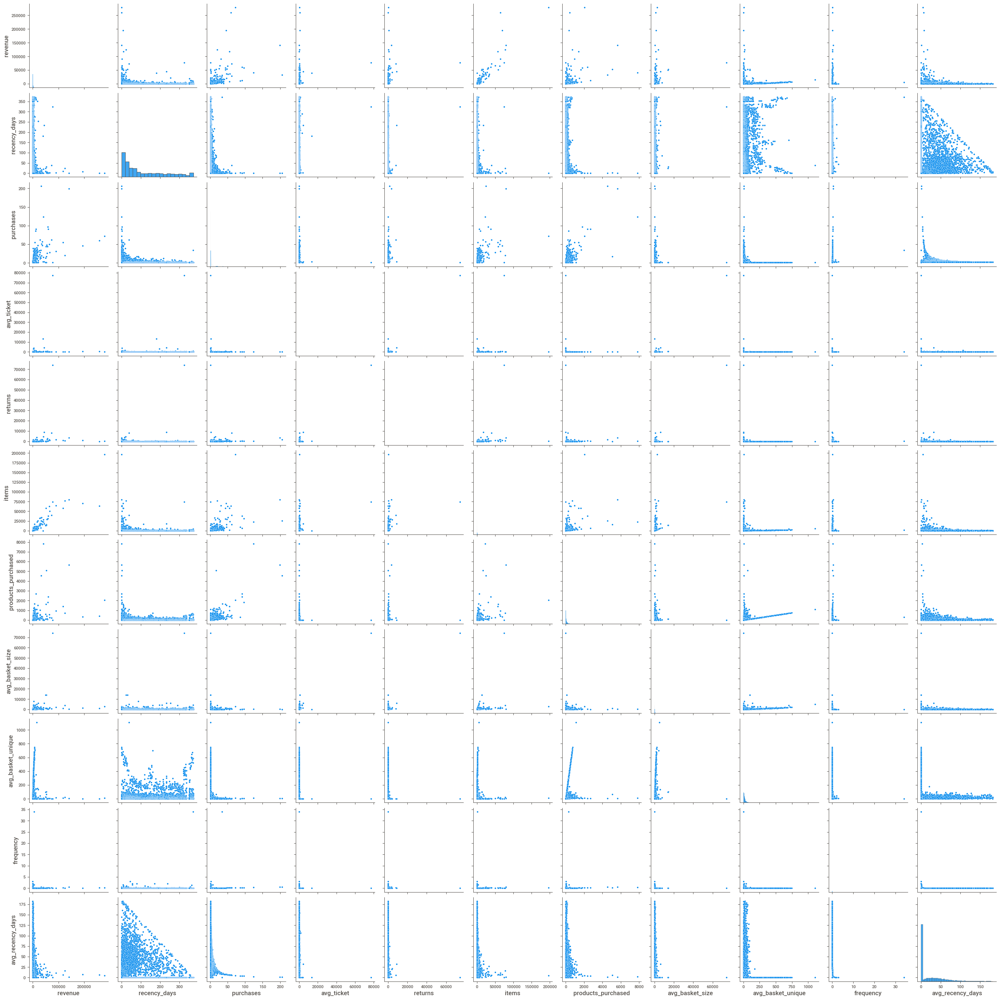

In [96]:
sns.pairplot(df42)

### 4.3 Estudo de Espaço

In [97]:
df43 = df4.drop( columns=['customer_id'], axis=1).copy()

In [98]:
# Data encoding
mm = MinMaxScaler()
columns = ['revenue', 'recency_days', 'purchases', 'avg_ticket', 'returns',
       'items', 'products_purchased', 'avg_basket_size', 'avg_basket_unique',
       'frequency', 'avg_recency_days']
df43[columns] = mm.fit_transform(df43[columns])

In [99]:
X = df43.copy()

#### 4.3.1 PCA

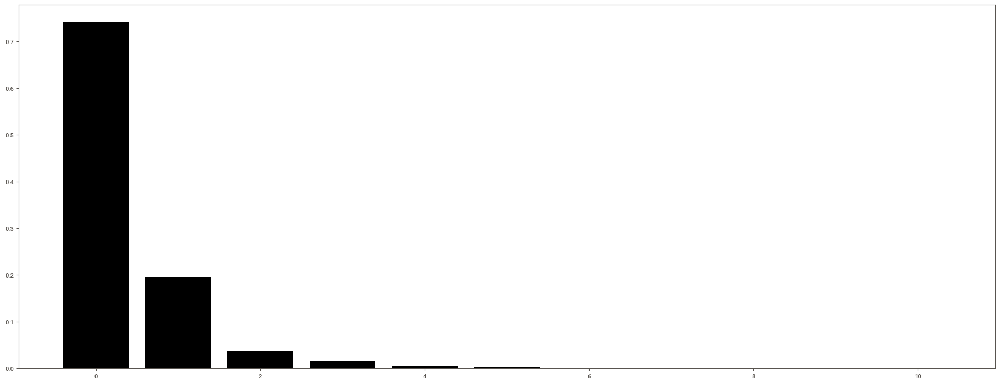

In [100]:
pca = dd.PCA( n_components = X.shape[1])

principal_components = pca.fit_transform( X )

# plot explained variable
features = range( pca.n_components_ )

plt.bar( features, pca.explained_variance_ratio_, color='black')

# pca component
df_pca = pd.DataFrame( principal_components )

<Axes: xlabel='0', ylabel='1'>

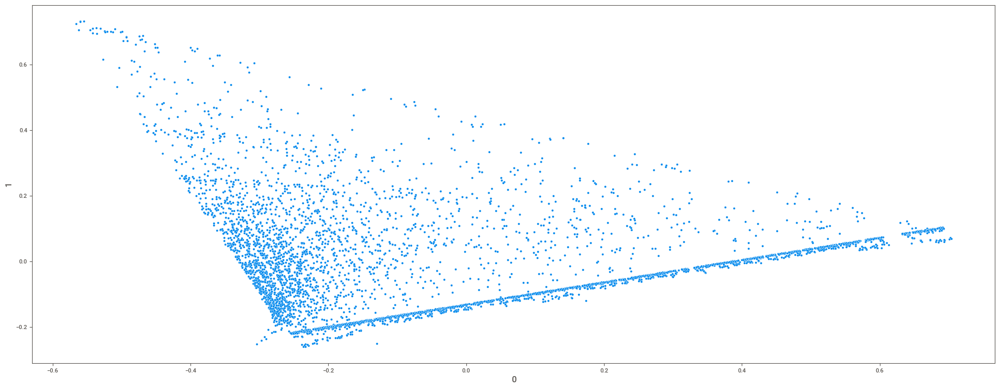

In [101]:
sns.scatterplot( x=0, y=1, data=df_pca)

#### 4.3.2 UMAP

/home/natan/miniconda3/envs/clusterenv/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


<Axes: xlabel='embedding_x', ylabel='embedding_y'>

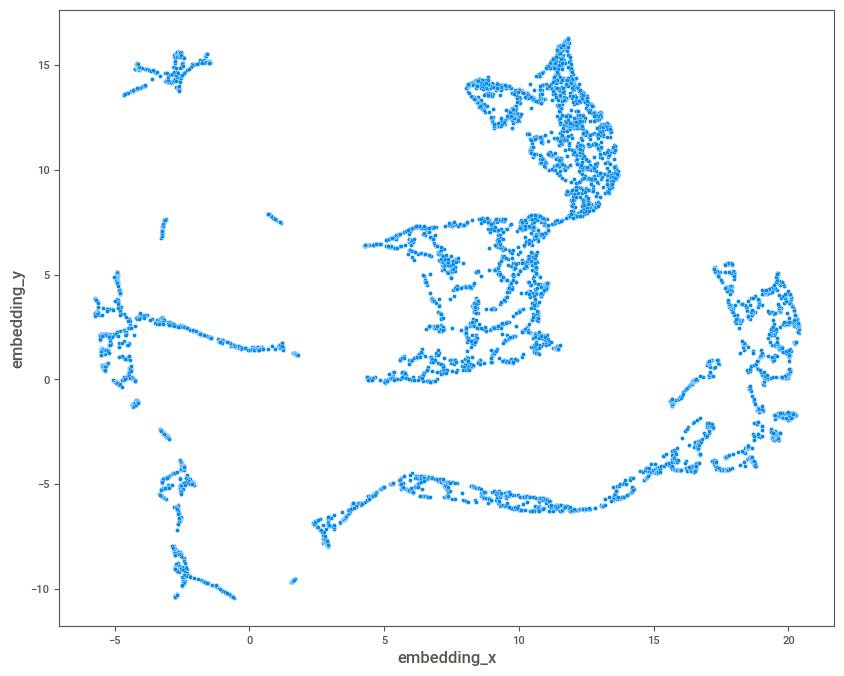

In [102]:
reducer = umap.UMAP( random_state=42 )
embedding = reducer.fit_transform( X )

# embedding
df_pca['embedding_x'] = embedding[:, 0]
df_pca['embedding_y'] = embedding[:, 1]

# plot UMAP
plt.figure(figsize=(10,8))
sns.scatterplot(x='embedding_x', y='embedding_y', 
                data=df_pca)

#### 4.3.3 t-SNE

<Axes: xlabel='embedding_x', ylabel='embedding_y'>

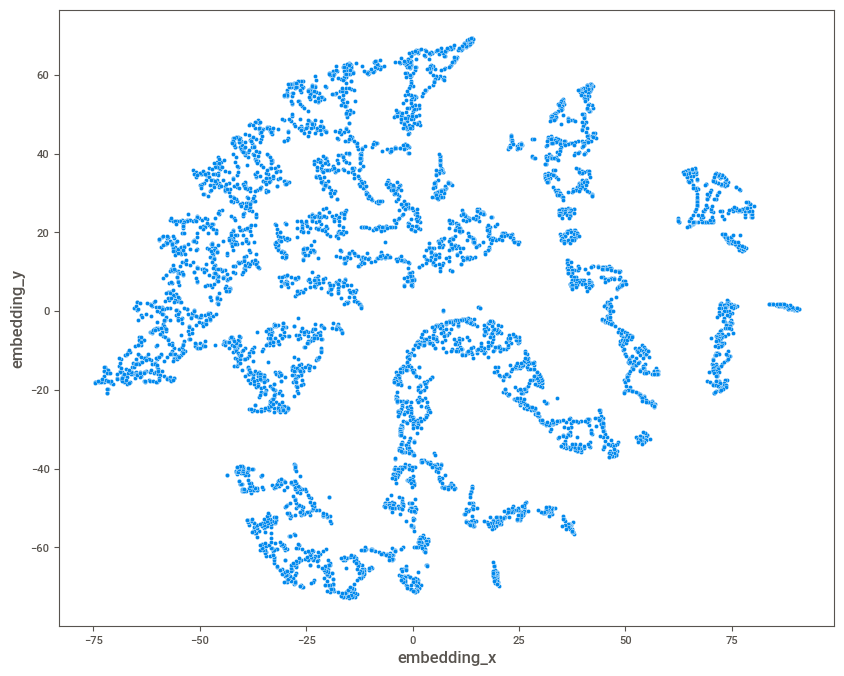

In [103]:
reducer = TSNE( n_components=2, 
                    n_jobs=-1,
                    random_state=42 )
embedding = reducer.fit_transform( X )

# embedding
df_pca['embedding_x'] = embedding[:, 0]
df_pca['embedding_y'] = embedding[:, 1]

# plot UMAP
plt.figure(figsize=(10,8))
sns.scatterplot(x='embedding_x', y='embedding_y', 
                data=df_pca)

#### 4.4.4 Tree-Based Embedding

In [104]:
X = df4.drop( columns=['customer_id', 'revenue'], axis=1 )
y = df4['revenue']

# model definition
rf = RandomForestRegressor( n_estimators=100, 
                           random_state=42)
# model training
rf.fit(X, y)

# leaf

# dataframe leaf

RandomForestRegressor(random_state=42)

In [105]:
df_leaf = pd.DataFrame( rf.apply( X ) )

/home/natan/miniconda3/envs/clusterenv/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


<Axes: xlabel='embedding_x', ylabel='embedding_y'>

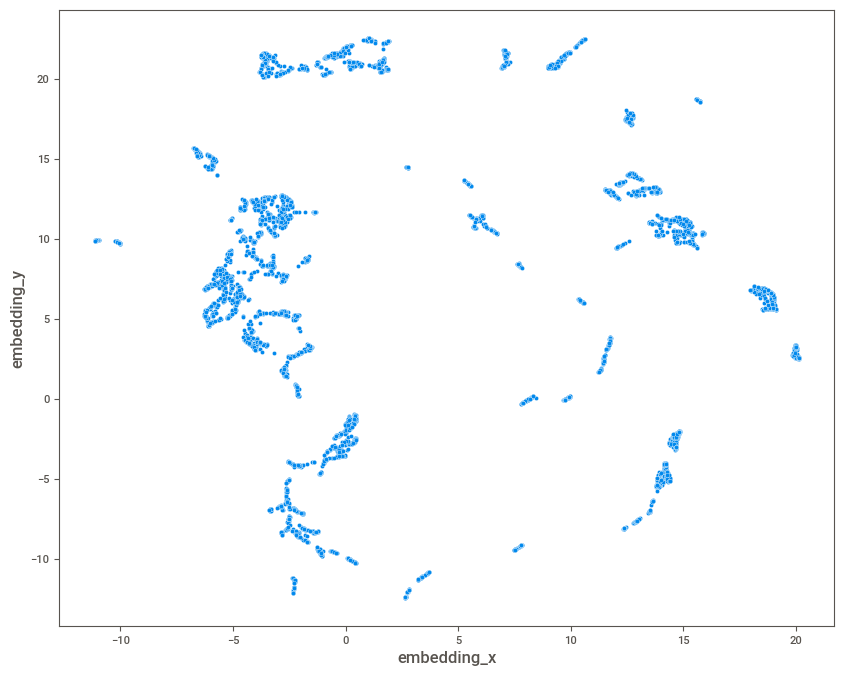

In [106]:
reducer = umap.UMAP( n_neighbors=20, random_state=42 )
embedding = reducer.fit_transform( df_leaf )

# embedding
df_pca['embedding_x'] = embedding[:, 0]
df_pca['embedding_y'] = embedding[:, 1]

# plot UMAP
plt.figure(figsize=(10,8))
sns.scatterplot(x='embedding_x', y='embedding_y', 
                data=df_pca)

# 5.0 Data Preparation

In [23]:
df3 = df_ref.copy()

In [24]:
df_ref.columns

Index(['customer_id', 'revenue', 'recency_days', 'purchases', 'avg_ticket',
       'returns', 'items', 'products_purchased', 'avg_basket_size',
       'avg_basket_unique', 'frequency', 'avg_recency_days'],
      dtype='object')

In [25]:
# standart scaler
mm = MinMaxScaler()

colunas = ['revenue', 'recency_days', 'purchases', 'avg_ticket',
       'returns', 'items', 'products_purchased', 'avg_basket_size',
       'avg_basket_unique', 'frequency', 'avg_recency_days']

df3[colunas] = mm.fit_transform(df3[colunas])
# # revenue
# df3['revenue'] = ss.fit_transform(df3[['revenue']])
# # recency_days
# df3['recency_days'] = ss.fit_transform(df3[['recency_days']])
# # purchases
# df3['purchases'] = ss.fit_transform(df3[['purchases']])
# # avg_ticket
# df3['avg_ticket'] = ss.fit_transform(df3[['avg_ticket']])
# # returns
# df3['returns'] = ss.fit_transform(df3[['returns']])
# # revenue
# df3['items'] = ss.fit_transform(df3[['items']])
# # revenue
# df3['products_purchased'] = ss.fit_transform(df3[['products_purchased']])
# # revenue
# df3['avg_basket_size'] = ss.fit_transform(df3[['avg_basket_size']])

In [26]:
df3.head()

,customer_id,revenue,recency_days,purchases,avg_ticket,returns,items,products_purchased,avg_basket_size,avg_basket_unique,frequency,avg_recency_days
0,17850,0.019,0.995,0.161,0.000,0.001,0.009,0.038,0.001,0.000,1.000,0.000
1,13047,0.012,0.150,0.039,0.000,0.000,0.007,0.022,0.002,0.010,0.001,0.216
2,12583,0.024,0.005,0.068,0.000,0.001,0.026,0.029,0.005,0.007,0.001,0.133
3,13748,0.003,0.255,0.020,0.000,0.000,0.002,0.003,0.001,0.004,0.001,0.379
4,15100,0.003,0.893,0.010,0.004,0.000,0.000,0.000,0.000,0.000,0.002,0.071


# 6.0 Feature Selection

## 6.1 Split Train & Validation

## 6.2 Fature Selection

### Boruta

### Fature Importance

# 7.0 Hyperparameter Fine-Tunning

In [27]:
df4 = df3.copy()
X = df4.drop( columns=['customer_id'])

In [28]:
cluster = [2, 3, 4, 5, 6, 7, 8, 9, 10]

### 7.1 K-Means

In [43]:
kmeans_list = []
for k in cluster:

    # model definition
    kmeans_model = KMeans( n_clusters=k, n_init=10)

    # model training
    kmeans_model.fit( X )

    # model predict
    labels = kmeans_model.predict( X )

    # model performance
    sil = metrics.silhouette_score(X, labels, metric='euclidean')
    kmeans_list.append( sil )

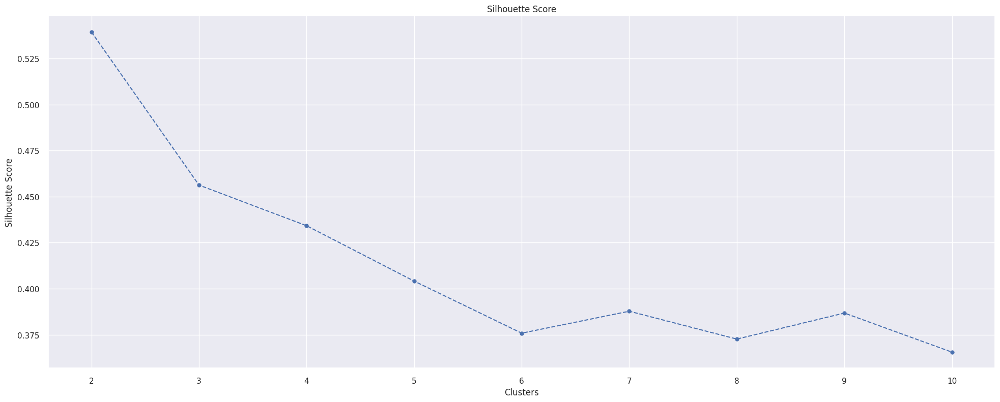

In [47]:
plt.plot(cluster, kmeans_list, linestyle='--', marker='o', color='b');
plt.xlabel( 'Clusters' );
plt.ylabel( 'Silhouette Score' );
plt.title( 'Silhouette Score' );

### 7.2 GMM

In [29]:
gmm_list = []
for k in cluster:

    # model definition
    gmm_model = GaussianMixture( n_components=k )

    # model training
    gmm_model.fit( X )

    # model prediction
    labels = gmm_model.predict( X )

    # model performance
    sil = metrics.silhouette_score( X, labels, metric= 'euclidean')
    
    gmm_list.append( sil )
   

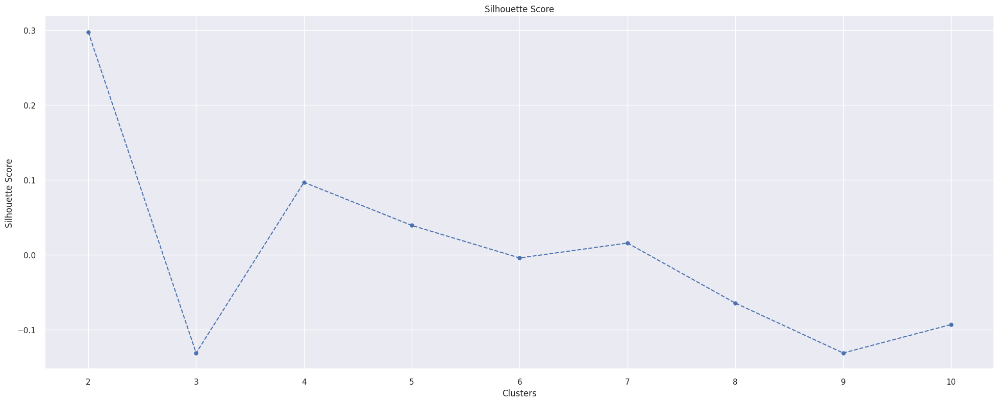

In [48]:
plt.plot(cluster, gmm_list, linestyle='--', marker='o', color='b');
plt.xlabel('Clusters');
plt.ylabel('Silhouette Score');
plt.title('Silhouette Score');

### 7.3 Hierarchical Clustering

### 7.4 DBSCAN

### 7.5 Results

In [77]:
df_results = pd.DataFrame({'KMeans':kmeans_list, 'GMM': gmm_list}).T
df_results.columns = cluster

In [79]:
df_results.style.highlight_max(color='lightgreen', axis=1)

,2,3,4,5,6,7,8,9,10
KMeans,0.539398,0.456246,0.434194,0.404125,0.375848,0.387760,0.372634,0.386773,0.365547
GMM,0.297648,-0.131319,0.096802,0.039222,-0.004254,0.015671,-0.064612,-0.131289,-0.093281


### Within-Cluster Sum of Squares (WSS)

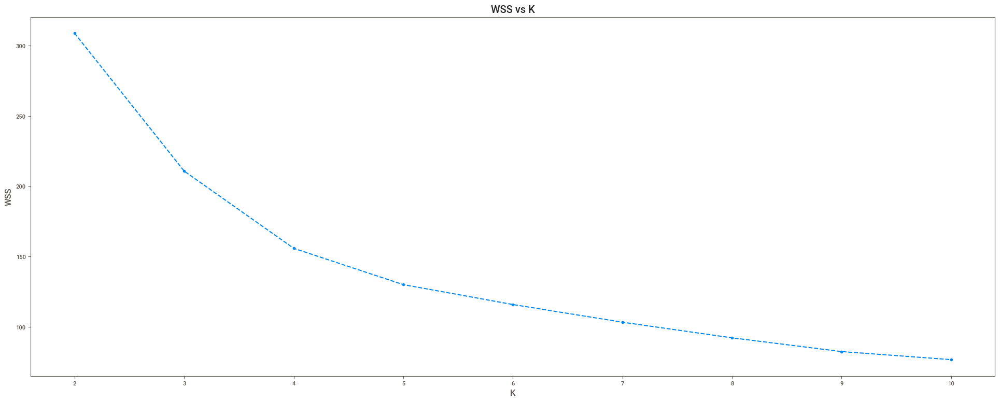

In [71]:
wss = []
for k in cluster:
    # model definition
    kmeans = KMeans(init='random', n_clusters=k, n_init=10,  max_iter=300, random_state=42)

    # model training
    kmeans.fit( X )

    #validation
    wss.append(kmeans.inertia_)

# plot wss - Elbow Method
plt.plot(cluster, wss, linestyle='--', marker='o');
plt.xlabel( 'K' );
plt.ylabel( 'WSS' );
plt.title('WSS vs K');
plt.show()

### Silhouette Score

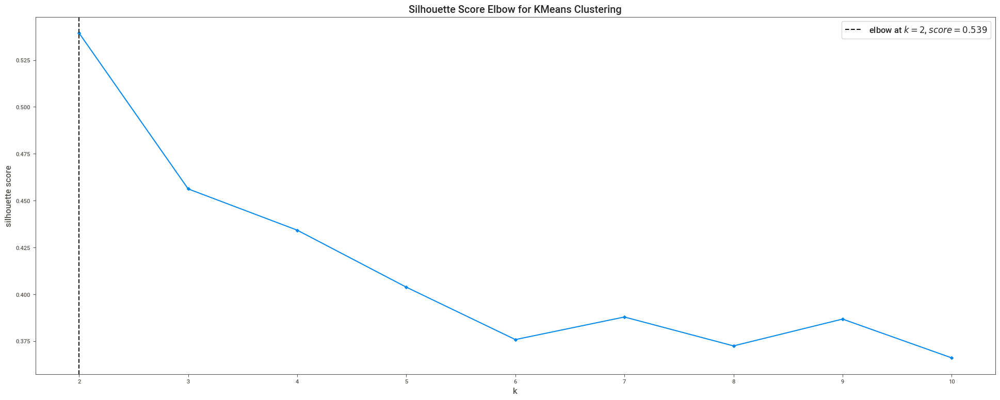

In [73]:
kmenas = KElbowVisualizer( KMeans(n_init=10), k=cluster, metric='silhouette', timings=False);
kmenas.fit( X );
kmenas.show();

### Silhouette Analysis

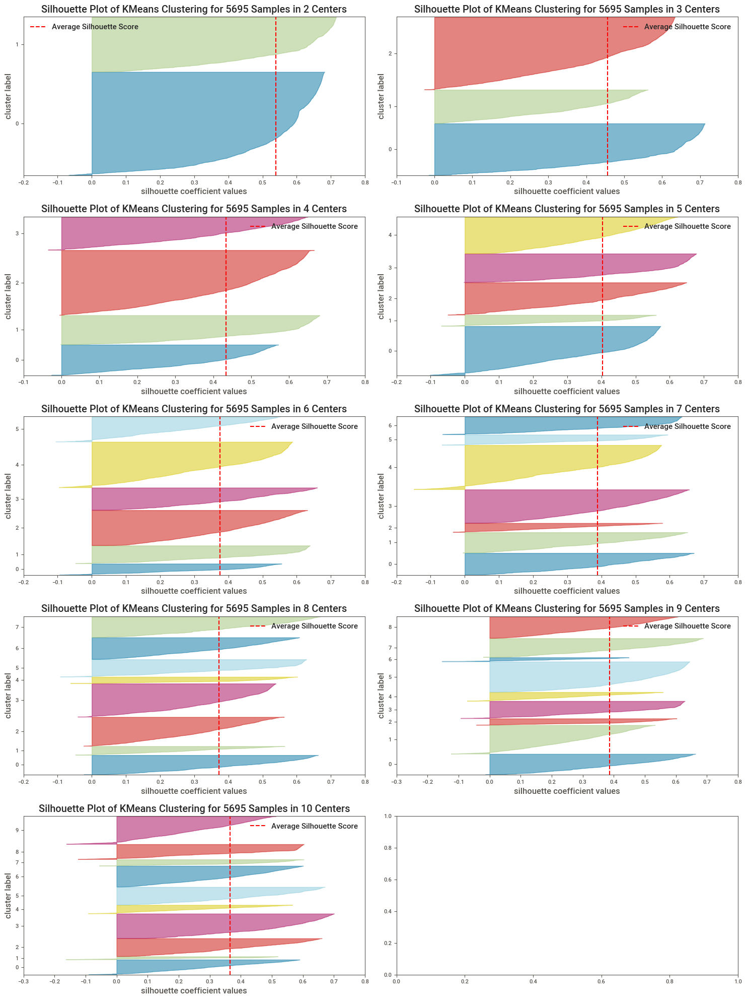

In [74]:
fig, ax = plt.subplots(5, 2, figsize=(15,20))

for k in cluster:
    km = KMeans(n_clusters=k, init='random', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod( k - 2, 2)

    viz = SilhouetteVisualizer( km, colors='yellowbrick', ax=ax[q][mod])
    viz.fit( X )
    viz.finalize()

plt.tight_layout()
plt.show()

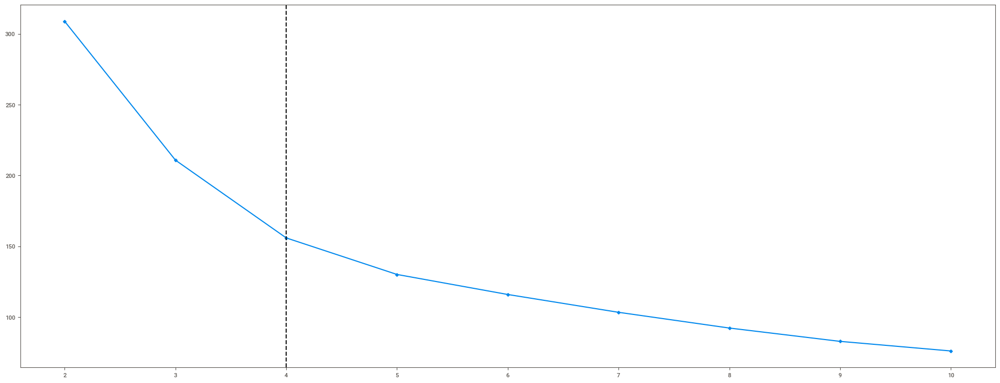

In [72]:
# yellowbrick library
kmeans = KElbowVisualizer( KMeans(n_init=10), k=cluster, timings=False)
kmeans.fit( X );
# kmeans.show();

In [ ]:
# model definition

# model training 

# model predict

# model performance

# 8.0 Machine Learnign Modeling

In [43]:
# model definition
k = 5
kmeans = KMeans(init='random', n_clusters=k, n_init=10, max_iter=300, random_state=42)

# model trainig 
kmeans.fit ( X )

# clustering
labels = kmeans.labels_

### Cluster Validation

In [44]:
# WSS 
print( f'WSS value: {kmeans.inertia_}')

# Silhouette
print(f'SS Value: {metrics.silhouette_score( X, labels, metric="euclidean")}')

WSS value: 37554.19625820877


SS Value: 0.32320731086614335


# 9.0 Cluster Analysis

In [45]:
df5 = df_ref.copy()
df5['cluster'] = labels

### 2D Plot

FloatingPointError: underflow encountered in multiply

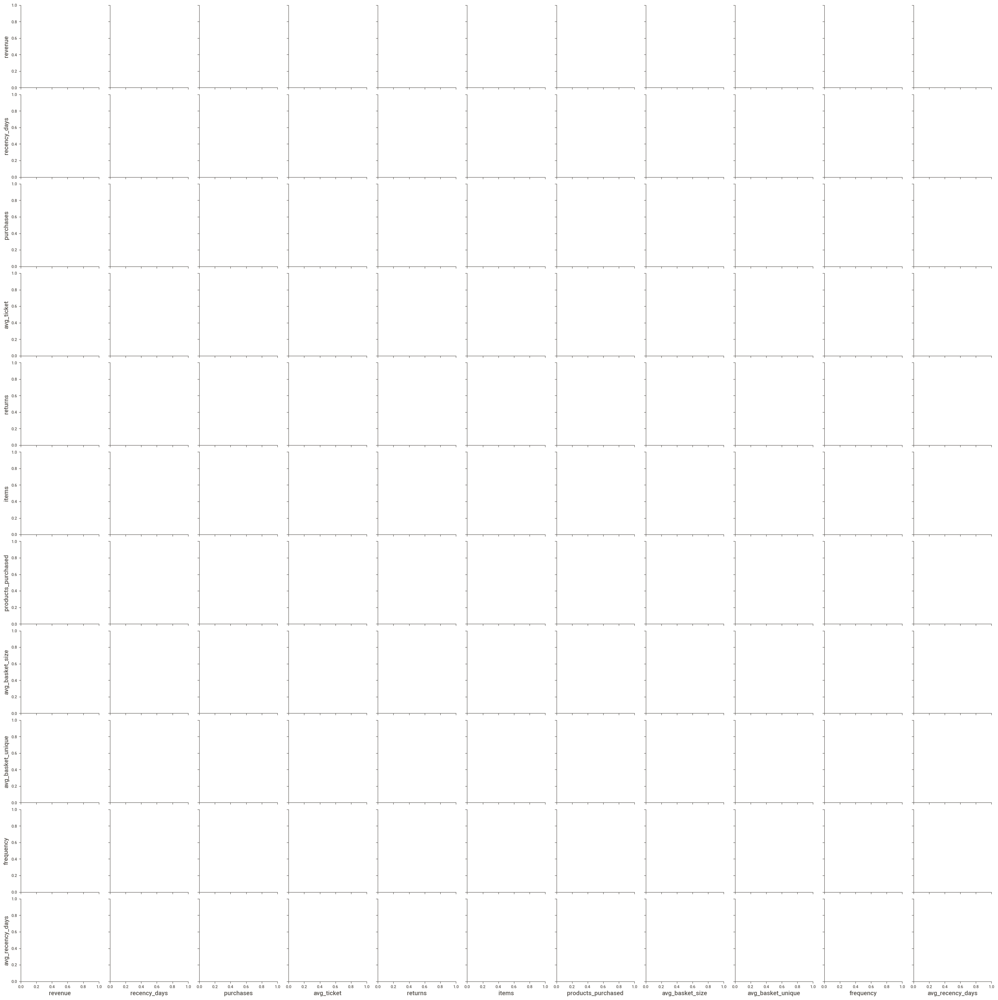

In [46]:
df_viz = df5.drop(columns='customer_id', axis=1)
sns.pairplot(df_viz, hue='cluster')

### Visualization Inspection

In [54]:
df3.head()

,customer_id,revenue,recency_days,purchases,avg_ticket,returns,items,products_purchased,avg_basket_size,avg_basket_unique,frequency,avg_recency_days
0,17850,0.454,2.282,4.482,-0.028,-0.004,0.171,0.971,-0.181,-0.406,74.094,-0.698
1,13047,0.181,-0.541,0.812,-0.028,-0.007,0.093,0.373,-0.094,-0.272,0.001,0.493
2,12583,0.621,-1.025,1.692,-0.020,0.003,0.916,0.662,0.056,-0.318,0.027,0.036
3,13748,-0.108,-0.191,0.224,-0.016,-0.031,-0.122,-0.307,-0.150,-0.446,-0.022,1.396
4,15100,-0.117,1.941,-0.069,0.185,-0.016,-0.203,-0.426,-0.201,-0.506,0.102,-0.305


In [ ]:
# 3 clusters and without avg ticket
fig = px.scatter_3d(df3, x='recency_days', y='frequency', z='revenue', color='cluster')
fig.show()

/home/natan/miniconda3/envs/clusterenv/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


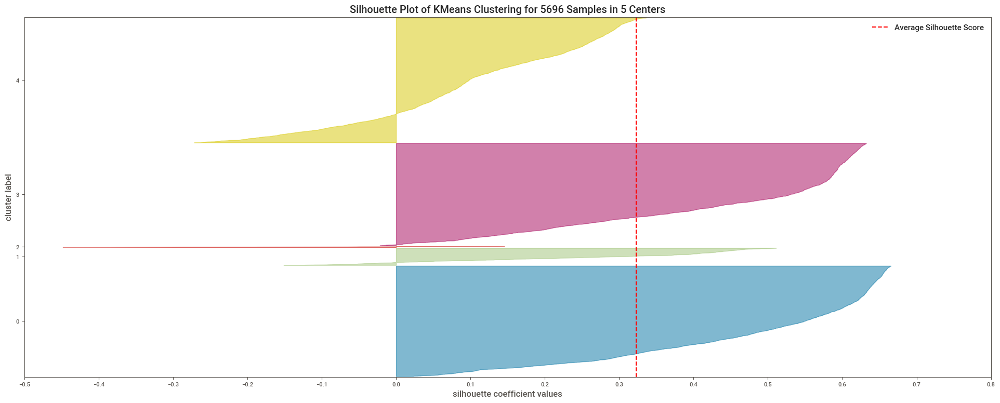

In [47]:
# 4 Clusters with avg ticket
viz = SilhouetteVisualizer( kmeans, colors='yellowbrick')
viz.fit( X )
viz.finalize()

### UMAP - t-SNE (Manifold)

/home/natan/miniconda3/envs/clusterenv/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


<Axes: xlabel='embedding_x', ylabel='embedding_y'>

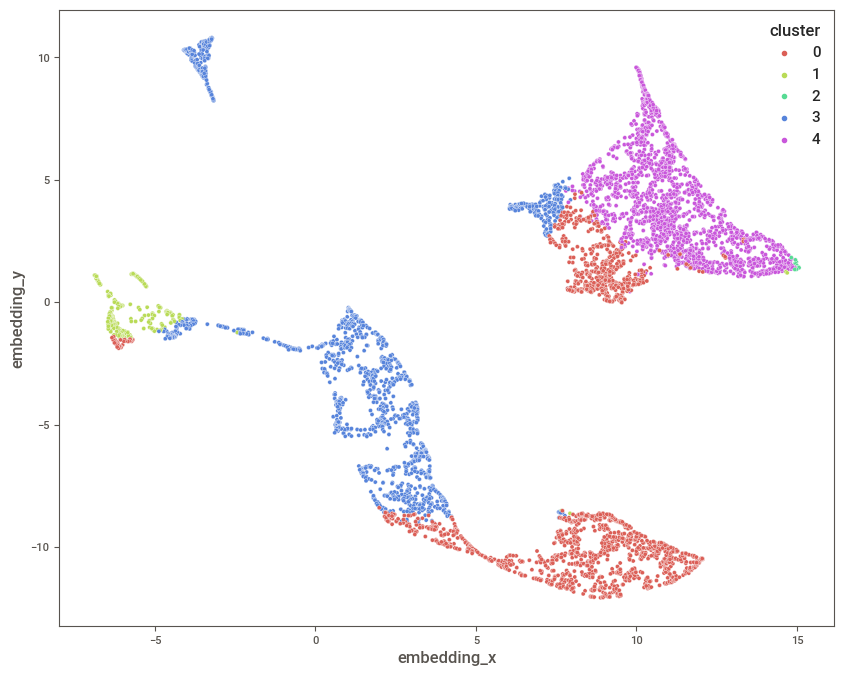

In [49]:
reducer = umap.UMAP( n_neighbors= 40, random_state=42 )
embedding = reducer.fit_transform( X )

# embedding
df_viz['embedding_x'] = embedding[:, 0]
df_viz['embedding_y'] = embedding[:, 1]

# plot UMAP
plt.figure(figsize=(10,8))
sns.scatterplot(x='embedding_x', y='embedding_y', 
                data=df_viz, 
                hue='cluster', 
                palette=sns.color_palette( 'hls', n_colors=len(df_viz['cluster'].unique())))

### Cluster Profile

In [50]:
df5.head()

,customer_id,revenue,recency_days,purchases,avg_ticket,returns,items,products_purchased,avg_basket_size,avg_basket_unique,frequency,avg_recency_days,cluster
0,17850,5391.210,371,34,18.152,40,1733,297,50.971,8.735,34.000,0.000,4
1,13047,3232.590,56,9,18.904,35,1390,171,154.444,19.000,0.028,39.375,4
2,12583,6705.380,2,15,28.902,50,5028,232,335.200,15.467,0.041,24.267,4
3,13748,948.250,95,5,33.866,0,439,28,87.800,5.600,0.018,69.250,4
4,15100,876.000,333,3,292.000,22,80,3,26.667,1.000,0.075,13.000,3


In [51]:
# Number of customers
df_cluster = df5[['customer_id', 'cluster']].groupby('cluster').count().reset_index()
df_cluster['per_customer'] = 100 * df_cluster['customer_id'] / df_cluster['customer_id'].sum()

# Avg revenue
df_avg_revenue = df5[['revenue', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_revenue, on='cluster', how='inner')

# Avg recency
df_avg_recency = df5[['recency_days', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_recency, on='cluster', how='inner')

# purchases
df_avg_frequency = df5[['purchases', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_frequency, on='cluster', how='inner')

# Avg Ticket
df_avg_ticket = df5[['avg_ticket', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_ticket, on='cluster', how='inner')

# returns
df_avg_ticket = df5[['returns', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_ticket, on='cluster', how='inner')

# product_quantity
df_avg_ticket = df5[['items', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_ticket, on='cluster', how='inner')

# avg_frquency
df_avg_ticket = df5[['products_purchased', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_ticket, on='cluster', how='inner')

# quantity
df_avg_ticket = df5[['avg_basket_size', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_ticket, on='cluster', how='inner')

In [52]:
df_cluster

,cluster,customer_id,per_customer,revenue,recency_days,purchases,avg_ticket,returns,items,products_purchased,avg_basket_size
0,0,1767,31.022,646.705,60.902,1.695,28.251,4.656,349.327,38.767,215.214
1,1,276,4.846,3223.817,156.239,1.004,12.954,0.522,993.703,319.822,989.313
2,2,17,0.298,111057.981,24.765,69.235,7974.324,10289.882,62398.176,2101.588,7804.541
3,3,1638,28.757,513.183,263.747,1.248,35.877,3.741,196.255,33.308,158.554
4,4,1998,35.077,2758.612,39.799,6.645,31.627,34.855,1647.170,140.285,239.709


# 10.0 Deploy